In [ ]:
import yfinance as yf
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

stocks = ["AAPL", "BA", "COP", "DAL", "FMCC", "INTC", "JPM", "MSFT", "NVDA", "QQQ", "SMWB", "SPY", "VST"]
period = "5y"
interval = "1d"

stock_yearly_returns = []
covs = []

yf_data = {'all_yearly':[]}

for ticker in stocks:
    data = yf.download(tickers=ticker, period=period, interval=interval,  prepost=False, repair=True, auto_adjust=False)
    close_ = np.array(data['Adj Close'][1:])
    open_ = np.array(data['Adj Close'][:-1])
    
    stock_return = ((close_/open_) - 1)
    stock_ave_return = np.mean(stock_return)
    stock_yearly_return = ((stock_ave_return + 1) ** 252) - 1

    yf_data[ticker] = {'open': open_, 'close': close_, 'daily_returns': stock_return, 'daily_ave_return': stock_ave_return, 'yealy_return': stock_yearly_return}
    stock_yearly_returns.append(stock_yearly_return)

for index, i in enumerate(stocks):
    covs.append([])
    stock = yf_data[i]
    n = len(stock['open'])

    for e in stocks:
        stock_e = yf_data[e]
        n_e = len(stock_e['open'])
        
        nn = min(n, n_e)
        cov = np.sum((stock['daily_returns'] - stock['daily_ave_return'])[-nn:] * (stock_e['daily_returns'] - stock_e['daily_ave_return'])[-nn:]) / (nn - 1)

        covs[index].append(cov * 252)

stock_yearly_returns = np.array(stock_yearly_returns)
covs = np.array(covs)

# number of stocks
num_stocks = len(stocks)

# number of porfolios to try
num_porfolios = 500_000

# initilize with 0s
possible_portfolios = np.zeros((num_porfolios, num_stocks))

# populate with random porfolio balances
for porfolio in range(num_porfolios):
    possible_portfolios[porfolio] = np.random.dirichlet(np.ones(num_stocks), size=1)

all_returns = []
all_stdev = []
all_weights = []
all_sharpes = []

# example
risk_free_rate = 0.02

for wr in possible_portfolios:


    portfolio_r = np.sum(wr * stock_yearly_returns)
    portfolio_v = wr.T @ covs @ wr
    portfolio_std = portfolio_v ** 0.5
    sharpe = (portfolio_r - risk_free_rate) / portfolio_std

    all_weights.append(wr)
    all_returns.append(portfolio_r)
    all_stdev.append(portfolio_std)
    all_sharpes.append(sharpe)

def portfolio_details(index, print_details=False):
    p_weights = np.array(all_weights)[index, :]
    p_return = all_returns[index]
    p_std = all_stdev[index]
    p_sharpe = all_sharpes[index]

    if print_details:
        for i, ticker in enumerate(stocks):
            print(f"  {ticker}: {p_weights[i] * 100:.4f}")
        print(f"return: {p_return:.2%}")
        print(f"stdev : {p_std:.2%}")
        print(f"Sharpe ratio : {p_sharpe:.2f}")

    return p_weights, p_return, p_std, p_sharpe



max_sharpe_idx = np.argmax(all_sharpes)

best_weights, best_return, best_std, best_sharpe = portfolio_details(max_sharpe_idx)

plt.scatter(all_stdev, all_returns, alpha=0.2)
plt.scatter(best_std, best_return, marker='*', s=200)
plt.xlabel("Volatility")
plt.ylabel("Return")
plt.show()

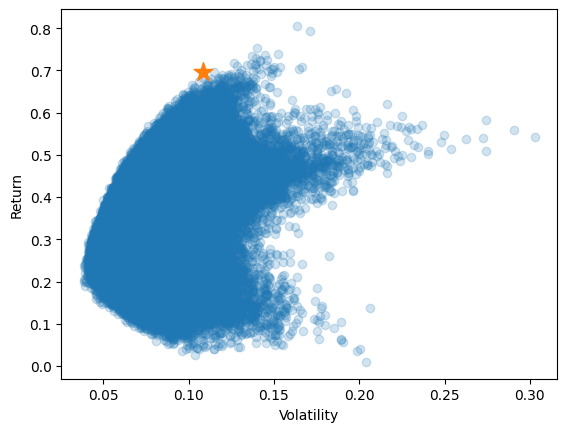

In [82]:
def portfolio_details(index, print_details=False):
    p_weights = np.array(all_weights)[index, :]
    p_return = all_returns[index]
    p_std = all_stdev[index]
    p_sharpe = all_sharpes[index]

    if print_details:
        for i, ticker in enumerate(stocks):
            print(f"  {ticker}: {p_weights[i] * 100:.4f}")
        print(f"return: {p_return:.2%}")
        print(f"stdev : {p_std:.2%}")
        print(f"Sharpe ratio : {p_sharpe:.2f}")

    return p_weights, p_return, p_std, p_sharpe



max_sharpe_idx = np.argmax(all_sharpes)

best_weights, best_return, best_std, best_sharpe = portfolio_details(max_sharpe_idx)

plt.scatter(all_stdev, all_returns, alpha=0.2)
plt.scatter(best_std, best_return, marker='*', s=200)
plt.xlabel("Volatility")
plt.ylabel("Return")
plt.show()

In [84]:
_ = portfolio_details(max_sharpe_idx, print_details=True)

  AAPL: 0.2880
  BA: 2.0615
  COP: 10.7419
  DAL: 0.6313
  FMCC: 11.0340
  INTC: 2.0613
  JPM: 4.7839
  MSFT: 1.5456
  NVDA: 41.1533
  QQQ: 1.9194
  SMWB: 1.1904
  SPY: 2.6177
  VST: 19.9719
return: 69.52%
stdev : 10.82%
Sharpe ratio : 2.05


In [85]:
fig = px.scatter(x=all_stdev, y=all_returns, color=range(num_porfolios))
fig.update_layout(xaxis_title="Volatility", yaxis_title="Return",)
fig.show()

In [86]:
_ = portfolio_details(260036, print_details=True)

  AAPL: 11.2113
  BA: 2.5572
  COP: 10.0258
  DAL: 0.6105
  FMCC: 5.6966
  INTC: 1.1533
  JPM: 14.8093
  MSFT: 15.5099
  NVDA: 8.0579
  QQQ: 1.4876
  SMWB: 0.4801
  SPY: 20.5770
  VST: 7.8234
return: 36.69%
stdev : 4.80%
Sharpe ratio : 1.58


In [83]:
my_weights = np.array([3.9, 4.29, 3.35, 5.73, 4.01, 3.12, 9.03, 19.40, 15.75, 3.52, 2.65, 10.68, 5.64])/100

my_portfolio_r = np.sum(my_weights * stock_yearly_returns)
my_portfolio_v = my_weights.T @ covs @ my_weights
my_portfolio_std = portfolio_v ** 0.5
my_sharpe = (my_portfolio_r - risk_free_rate) / my_portfolio_std
print(f"return: {my_portfolio_r:.2%}")
print(f"stdev : {my_portfolio_std:.2%}")
print(f"Sharpe ratio : {my_sharpe:.2f}")

return: 35.98%
stdev : 28.08%
Sharpe ratio : 1.21
